**Major Project: Spotify Songs’ Genre Segmentation **

The music recommendations made by Spotify, a music app, are excellent. It recommends music based on the songs and artists you usually listen to. The algorithm groups comparable features into clusters, and these clusters aid in comprehending the auditory properties of diverse songs. Use this specific data set to construct an automated system.
We are given with the data set spotify dataset.csv files for the reference data set.


**Task 1: Performing data pre-processing operations.**
Data pre-processing is crucial for cleaning and preparing the dataset for analysis. Here are the typical steps involved:

->Load the Dataset: Read the CSV file into a DataFrame.

->Explore the Dataset: Understand the structure and content of the dataset.

->Handle Missing Values: Identify and handle missing values.

->Handle Duplicates: Identify and remove duplicate records.

->Convert Data Types: Ensure that each column has the appropriate data type.

->Normalize/Scale Features: Standardize the numerical features if necessary.

->Encode Categorical Variables: Convert categorical variables to numerical
formats if needed.

Let's go through these steps.

**Step 1: Load the Dataset**

First, I'll read the CSV file into a DataFrame.

In [1]:
import pandas as pd

# Load the dataset
file_path = "/content/spotify dataset.csv"
spotify_df = pd.read_csv(file_path)

# Display the first few rows of the dataset
spotify_df.head()


,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6.0,-2.634,1.0,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754.0
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11.0,-4.969,1.0,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600.0
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1.0,-3.432,0.0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616.0
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7.0,-3.778,1.0,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093.0
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1.0,-4.672,1.0,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052.0


**Step 2: Explore the Dataset**

Next, let's explore the dataset to understand its structure and content.

In [2]:
# Display basic information about the dataset
spotify_df.info()

# Display summary statistics
spotify_df.describe(include='all')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17581 entries, 0 to 17580
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  17581 non-null  object 
 1   track_name                17578 non-null  object 
 2   track_artist              17578 non-null  object 
 3   track_popularity          17581 non-null  int64  
 4   track_album_id            17581 non-null  object 
 5   track_album_name          17578 non-null  object 
 6   track_album_release_date  17581 non-null  object 
 7   playlist_name             17581 non-null  object 
 8   playlist_id               17581 non-null  object 
 9   playlist_genre            17581 non-null  object 
 10  playlist_subgenre         17581 non-null  object 
 11  danceability              17580 non-null  float64
 12  energy                    17580 non-null  float64
 13  key                       17580 non-null  float64
 14  loudne

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,17581,17578,17578,17581.000000,17581,17578,17581,17581,17581,17581,...,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000,17580.000000
unique,16084,13865,6459,NaN,12765,11606,3463,242,260,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,7BKLCZ1jbUBVqRi2FVlTVw,Alive,Queen,NaN,5fstCqs5NpIlF42VhPNv23,Greatest Hits,2020-01-10,Indie Poptimism,3Ho3iO0iJykgEQNbjB2sic,rap,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,6,12,136,NaN,29,102,134,308,182,5746,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,44.294352,NaN,NaN,NaN,NaN,NaN,NaN,...,5.341013,-6.973368,0.598350,0.109512,0.177662,0.068811,0.188932,0.515901,121.612006,224462.055347
std,NaN,NaN,NaN,24.157788,NaN,NaN,NaN,NaN,NaN,NaN,...,3.624589,3.098661,0.490246,0.108997,0.221049,0.203758,0.150922,0.226092,28.011051,58706.567867
min,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,NaN,NaN,NaN,28.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,2.000000,-8.415000,0.000000,0.038400,0.015800,0.000000,0.094200,0.345000,99.904000,187938.250000
50%,NaN,NaN,NaN,48.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,6.000000,-6.375000,1.000000,0.058900,0.083100,0.000011,0.128000,0.516000,120.047500,216733.000000
75%,NaN,NaN,NaN,63.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,9.000000,-4.856750,1.000000,0.136000,0.259000,0.002572,0.245000,0.690000,139.952250,253733.000000


**Step 3: Handle Missing Values**

Identify and handle missing values.

In [3]:
# Check for missing values
missing_values = spotify_df.isnull().sum()

# Display columns with missing values
missing_values[missing_values > 0]


track_name          3
track_artist        3
track_album_name    3
danceability        1
energy              1
key                 1
loudness            1
mode                1
speechiness         1
acousticness        1
instrumentalness    1
liveness            1
valence             1
tempo               1
duration_ms         1
dtype: int64

**Step 4: Handle Duplicates**

Identify and remove duplicate records.

In [4]:
# Check for duplicates
duplicates = spotify_df.duplicated().sum()

# Remove duplicates
spotify_df = spotify_df.drop_duplicates()

# Confirm duplicates have been removed
duplicates_after = spotify_df.duplicated().sum()


**Step 5: Convert Data Types**

Ensure that each column has the appropriate data type.

In [5]:
# Convert date columns to datetime
spotify_df['track_album_release_date'] = pd.to_datetime(spotify_df['track_album_release_date'], errors='coerce')

# Confirm the changes
spotify_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17581 entries, 0 to 17580
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   track_id                  17581 non-null  object        
 1   track_name                17578 non-null  object        
 2   track_artist              17578 non-null  object        
 3   track_popularity          17581 non-null  int64         
 4   track_album_id            17581 non-null  object        
 5   track_album_name          17578 non-null  object        
 6   track_album_release_date  16270 non-null  datetime64[ns]
 7   playlist_name             17581 non-null  object        
 8   playlist_id               17581 non-null  object        
 9   playlist_genre            17581 non-null  object        
 10  playlist_subgenre         17581 non-null  object        
 11  danceability              17580 non-null  float64       
 12  energy            

**Step 6: Normalize/Scale Features**

Standardize the numerical features if necessary.

In [6]:
from sklearn.preprocessing import StandardScaler

# Select numerical features for scaling
numerical_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
                      'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

# Initialize the scaler
scaler = StandardScaler()

# Scale the numerical features
spotify_df[numerical_features] = scaler.fit_transform(spotify_df[numerical_features])


**Step 7: Encode Categorical Variables**

Convert categorical variables to numerical formats if needed.

In [7]:
from sklearn.preprocessing import LabelEncoder

# Initialize label encoder
encoder = LabelEncoder()

# Encode categorical features
spotify_df['playlist_genre'] = encoder.fit_transform(spotify_df['playlist_genre'])
spotify_df['playlist_subgenre'] = encoder.fit_transform(spotify_df['playlist_subgenre'])



**Task 2: Data Analysis and Visualization**

To draw all possible plots to provide essential information and derive meaningful insights, we'll follow these steps:


->Distribution Plots: Visualize the distribution of numerical features.

->Correlation Heatmap: Show correlations between features.

->Pair Plot: Visualize relationships between pairs of features.

->Genre Analysis: Analyze the distribution of genres and subgenres.

->Temporal Analysis: Analyze trends over time.

->Popularity Analysis: Understand the distribution and factors influencing track popularity.

<Figure size 1500x1200 with 0 Axes>

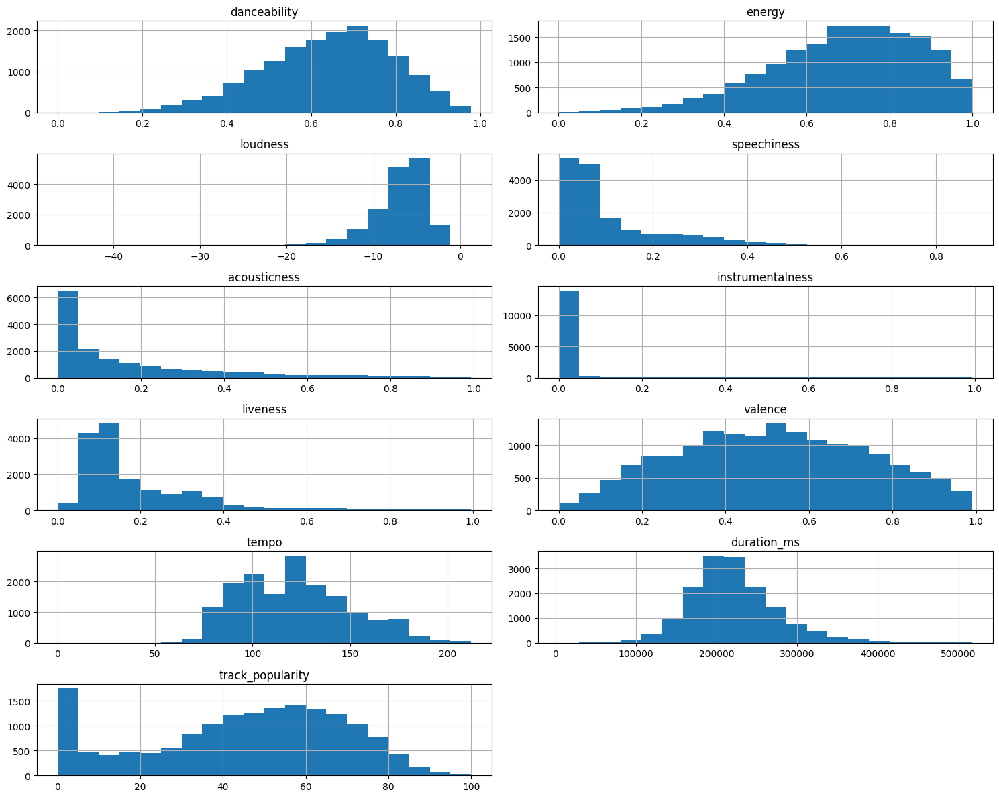

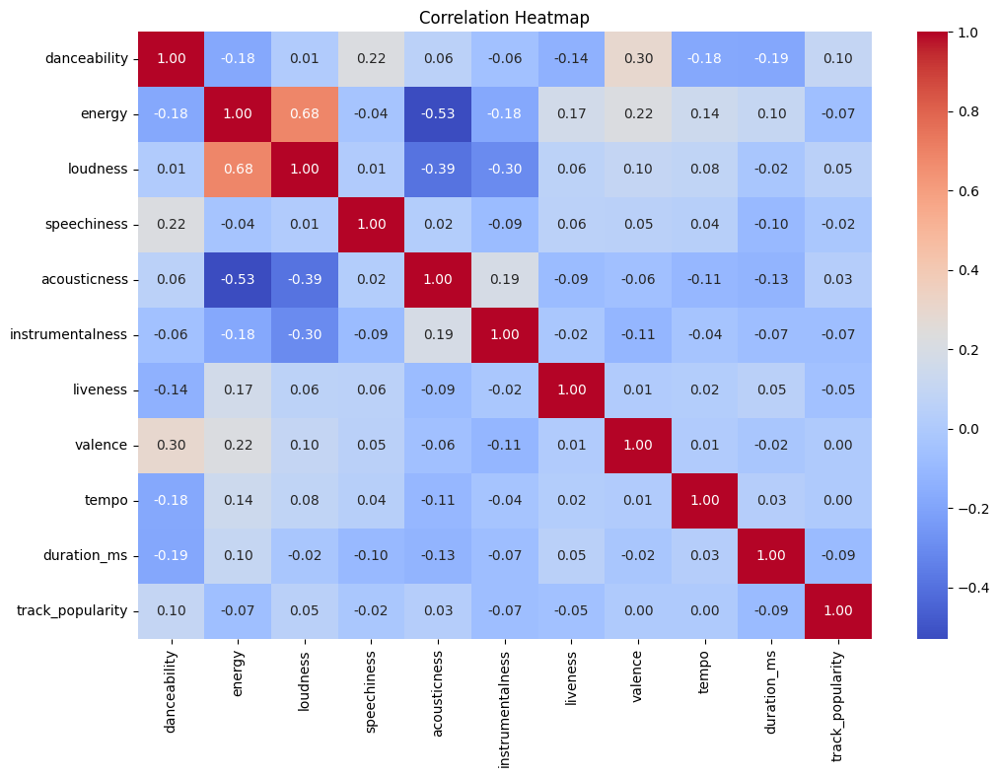

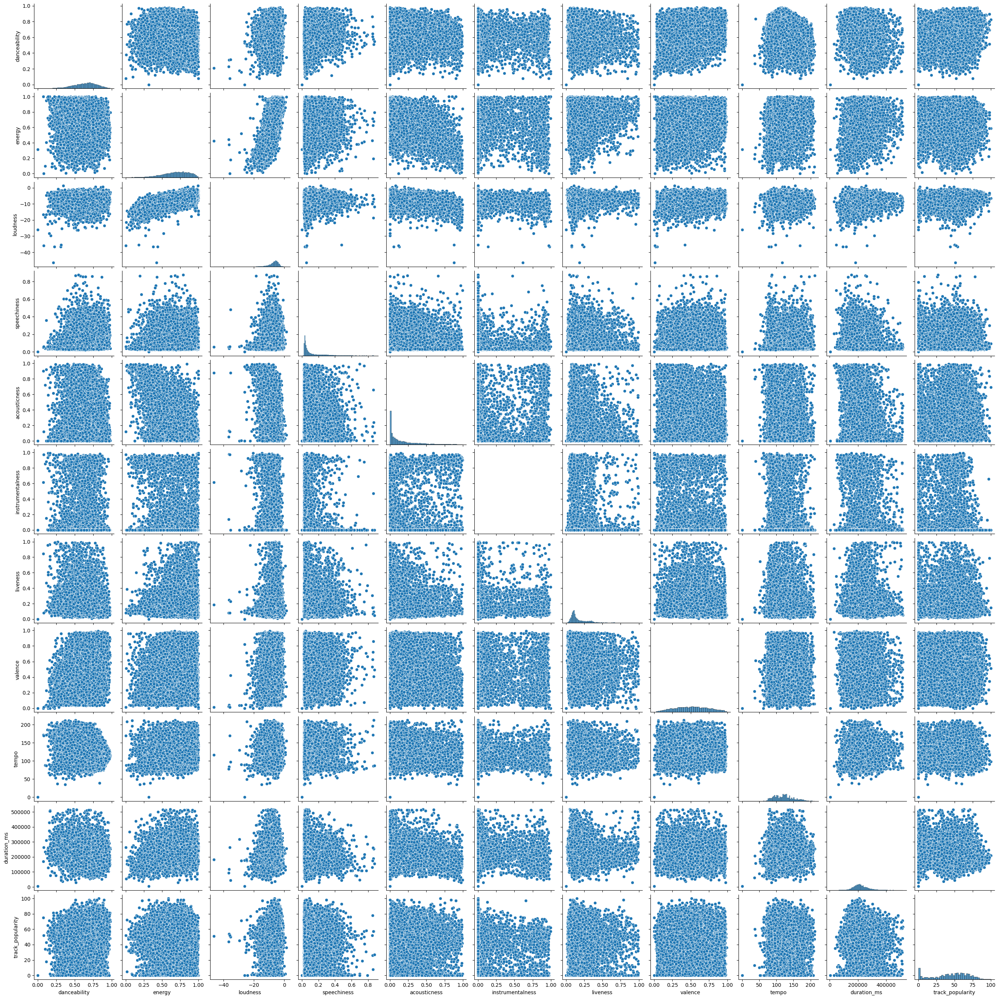

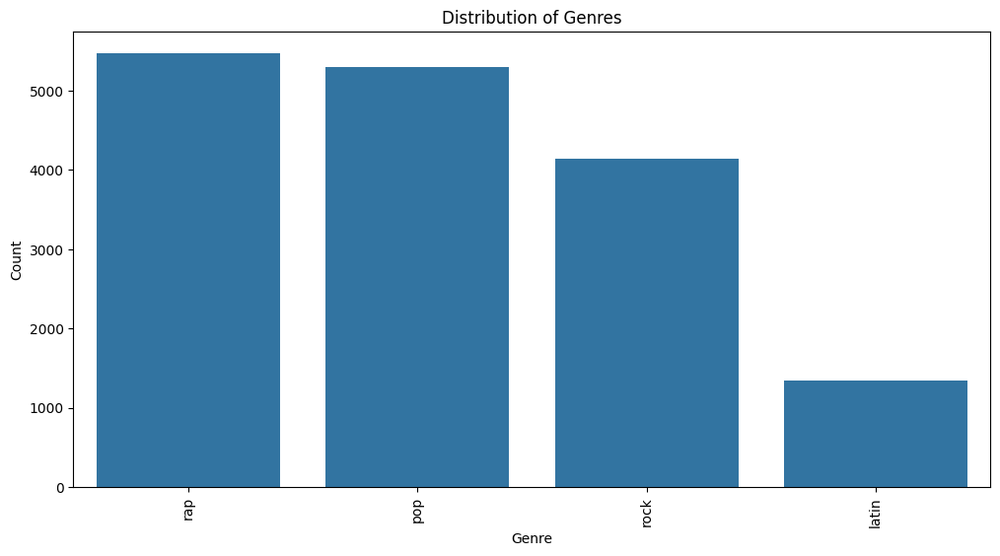

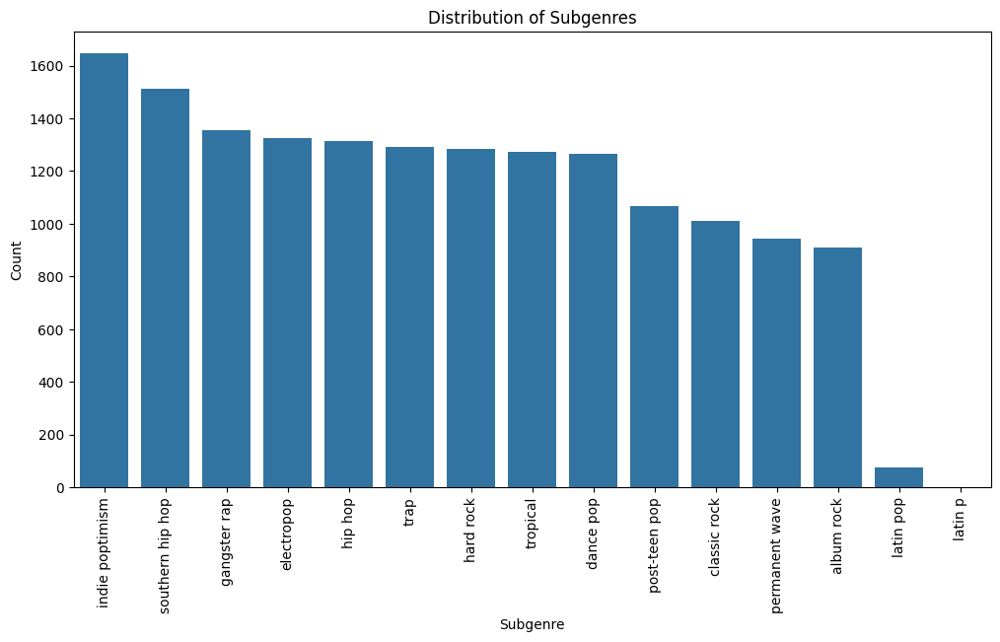

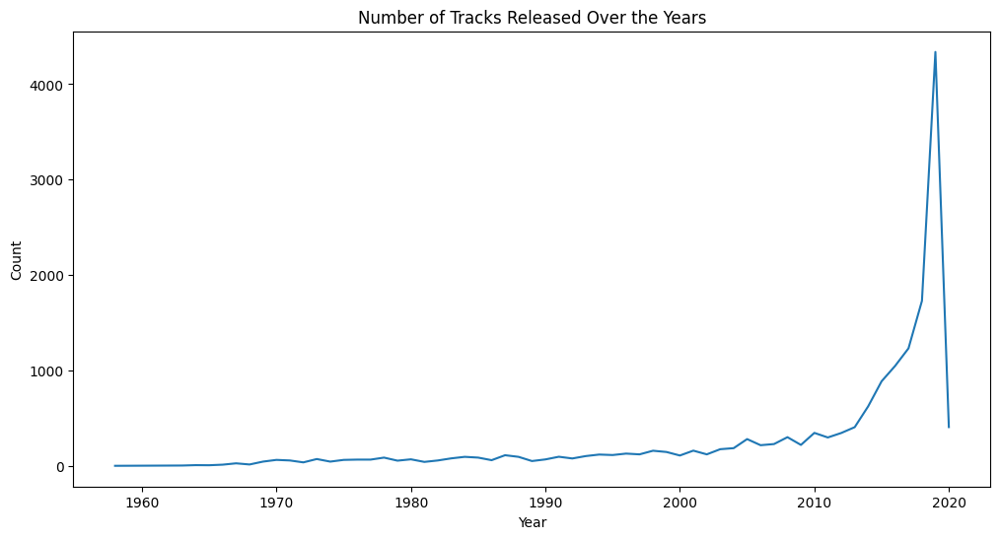

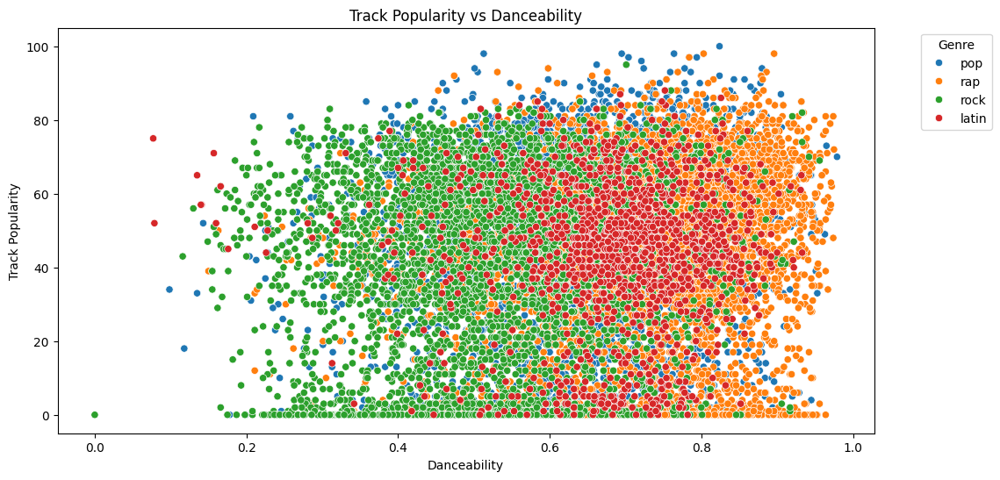

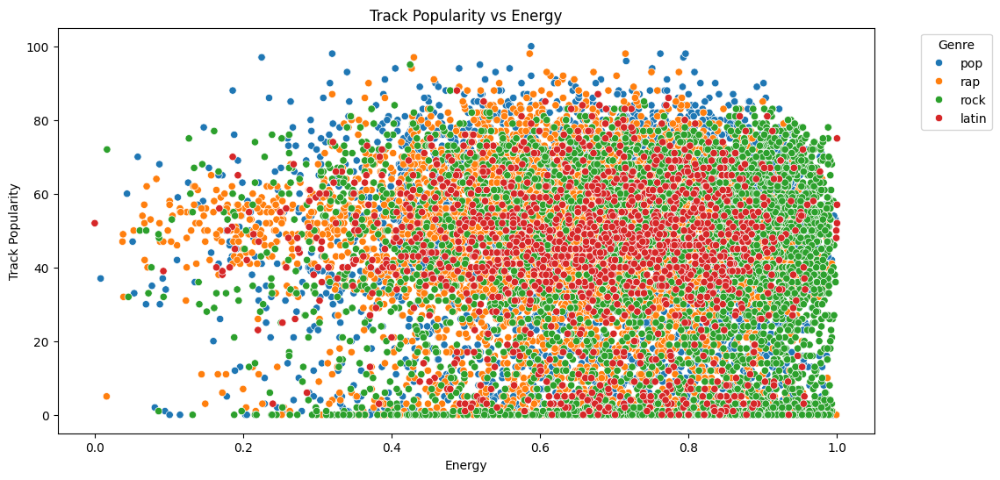

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/spotify dataset.csv'  # Update this with the correct file path if needed
spotify_df = pd.read_csv(file_path)

# Data preprocessing (handling missing values, duplicates, converting data types)
spotify_df.drop_duplicates(inplace=True)
spotify_df['track_album_release_date'] = pd.to_datetime(spotify_df['track_album_release_date'], errors='coerce')
spotify_df.dropna(subset=['track_album_release_date'], inplace=True)

# Step 2: Distribution Plots
numerical_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
                      'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity']

plt.figure(figsize=(15, 12))
spotify_df[numerical_features].hist(bins=20, layout=(6, 2), figsize=(15, 12))
plt.tight_layout()
plt.show()

# Step 3: Correlation Heatmap
plt.figure(figsize=(12, 8))
correlation_matrix = spotify_df[numerical_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# Step 4: Pair Plot
sns.pairplot(spotify_df[numerical_features])
plt.show()

# Step 5: Genre Analysis
plt.figure(figsize=(12, 6))
genre_counts = spotify_df['playlist_genre'].value_counts()
sns.barplot(x=genre_counts.index, y=genre_counts.values)
plt.title('Distribution of Genres')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 6))
subgenre_counts = spotify_df['playlist_subgenre'].value_counts()
sns.barplot(x=subgenre_counts.index, y=subgenre_counts.values)
plt.title('Distribution of Subgenres')
plt.xlabel('Subgenre')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Step 6: Temporal Analysis
plt.figure(figsize=(12, 6))
spotify_df['year'] = spotify_df['track_album_release_date'].dt.year
yearly_counts = spotify_df['year'].value_counts().sort_index()
sns.lineplot(x=yearly_counts.index, y=yearly_counts.values)
plt.title('Number of Tracks Released Over the Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

# Step 7: Popularity Analysis
plt.figure(figsize=(12, 6))
sns.scatterplot(data=spotify_df, x='danceability', y='track_popularity', hue='playlist_genre')
plt.title('Track Popularity vs Danceability')
plt.xlabel('Danceability')
plt.ylabel('Track Popularity')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(data=spotify_df, x='energy', y='track_popularity', hue='playlist_genre')
plt.title('Track Popularity vs Energy')
plt.xlabel('Energy')
plt.ylabel('Track Popularity')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



**Task 3: Correlation Matrix of Features According to the Datasets.**

We'll create a heatmap to visualize the correlations between the features in the dataset.

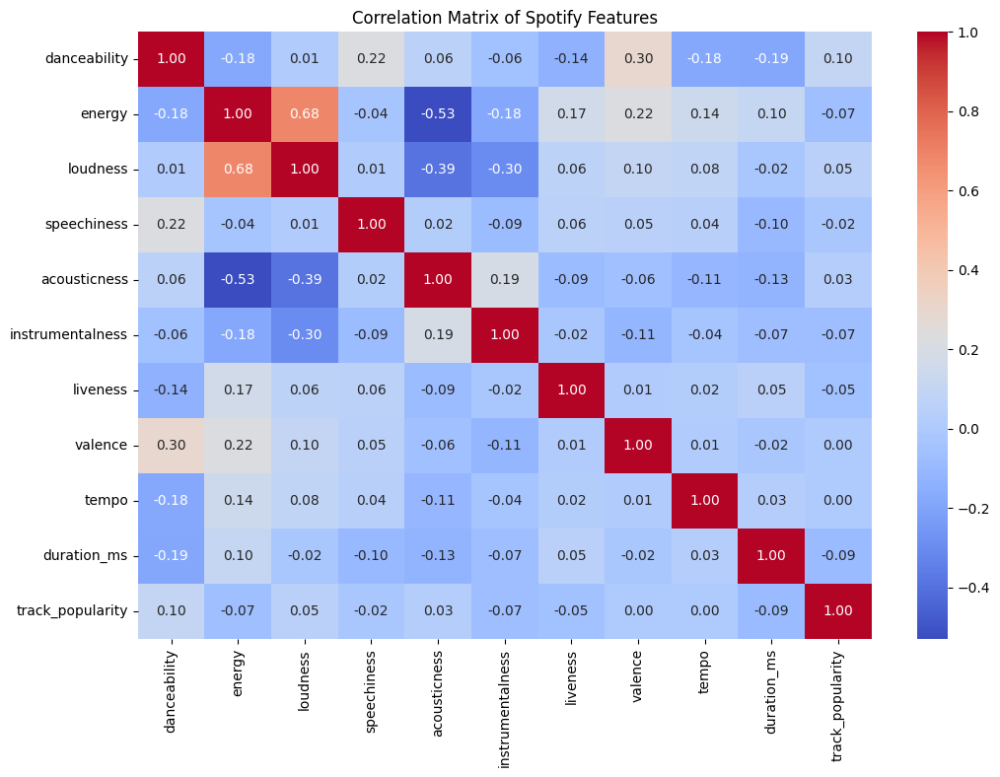

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/spotify dataset.csv'  # Update this with the correct file path if needed
spotify_df = pd.read_csv(file_path)

# Data preprocessing (handling missing values, duplicates, converting data types)
spotify_df.drop_duplicates(inplace=True)
spotify_df['track_album_release_date'] = pd.to_datetime(spotify_df['track_album_release_date'], errors='coerce')
spotify_df.dropna(subset=['track_album_release_date'], inplace=True)

# Numerical features for correlation matrix
numerical_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
                      'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity']

# Compute the correlation matrix
correlation_matrix = spotify_df[numerical_features].corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Spotify Features')
plt.show()


**Task 4: 	Finding  out and plot different clusters according to different parameters like playlist genres , playlist names.**

 we will perform clustering analysis on the dataset to identify different clusters based on parameters such as playlist genres and playlist names. We'll use the KMeans clustering algorithm for this purpose. Clustering can be done on numerical features, and we'll visualize the clusters using different parameters.

 Here are the steps we will follow:

->Data Preprocessing: Ensure the data is clean and ready for clustering.

->Feature Selection: Select the relevant features for clustering.

->Standardization: Standardize the features to ensure they are on a comparable scale.

->KMeans Clustering: Apply the KMeans clustering algorithm.

->Visualization: Visualize the clusters using different parameters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


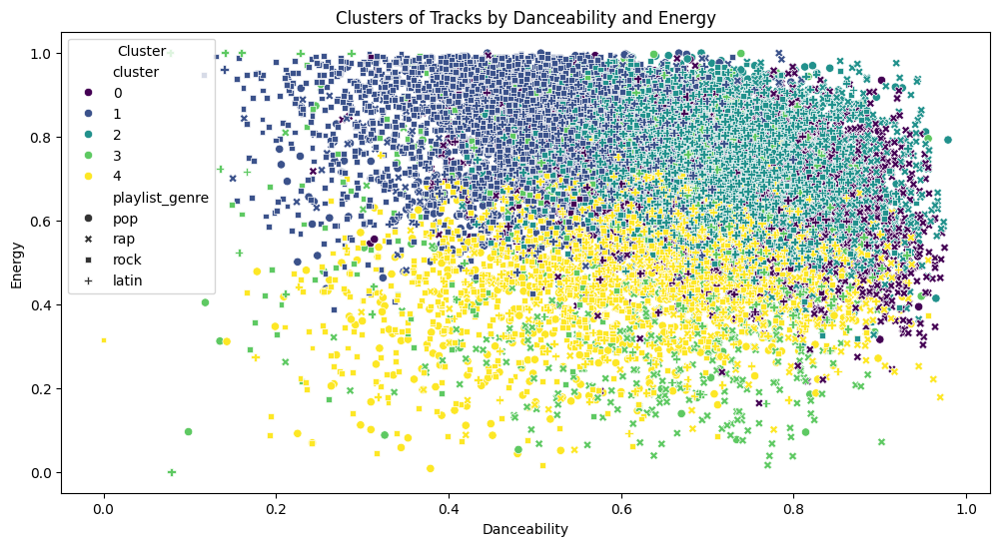

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128153 (\N{BLUE HEART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129321 (\N{GRINNING FACE WITH STAR EYES}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129322 (\N{GRINNING FACE WITH ONE LARGE AND ONE SMALL EYE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128138 (\N{PILL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128057 (\N{HAMSTER FACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist

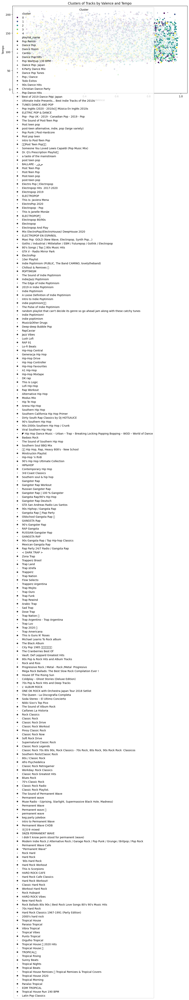

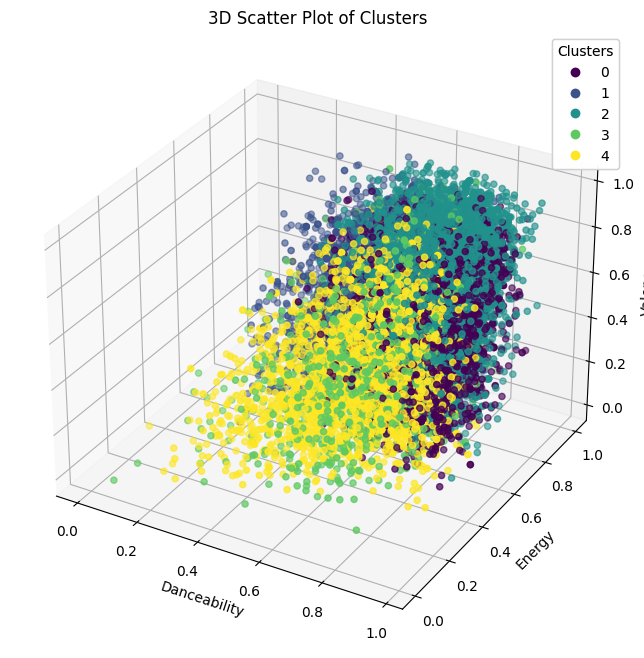

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Load the dataset
file_path = '/content/spotify dataset.csv'  # Update this with the correct file path if needed
spotify_df = pd.read_csv(file_path)

# Data preprocessing (handling missing values, duplicates, converting data types)
spotify_df.drop_duplicates(inplace=True)
spotify_df['track_album_release_date'] = pd.to_datetime(spotify_df['track_album_release_date'], errors='coerce')
spotify_df.dropna(subset=['track_album_release_date'], inplace=True)

# Select features for clustering
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
            'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

# Handle missing values
imputer = SimpleImputer(strategy='mean')
imputed_features = imputer.fit_transform(spotify_df[features])

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(imputed_features)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # You can change the number of clusters
spotify_df['cluster'] = kmeans.fit_predict(scaled_features)

# Visualize clusters by playlist genres
plt.figure(figsize=(12, 6))
sns.scatterplot(data=spotify_df, x='danceability', y='energy', hue='cluster', palette='viridis', style='playlist_genre')
plt.title('Clusters of Tracks by Danceability and Energy')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.legend(title='Cluster')
plt.show()

# Visualize clusters by playlist names
plt.figure(figsize=(12, 6))
sns.scatterplot(data=spotify_df, x='valence', y='tempo', hue='cluster', palette='viridis', style='playlist_name')
plt.title('Clusters of Tracks by Valence and Tempo')
plt.xlabel('Valence')
plt.ylabel('Tempo')
plt.legend(title='Cluster')
plt.show()

# Visualize clusters in 3D
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(spotify_df['danceability'], spotify_df['energy'], spotify_df['valence'], c=spotify_df['cluster'], cmap='viridis')
ax.set_title('3D Scatter Plot of Clusters')
ax.set_xlabel('Danceability')
ax.set_ylabel('Energy')
ax.set_zlabel('Valence')
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)
plt.show()


** Final result: Building the Recommendation System model **


In [14]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# Load the dataset
file_path = '/content/spotify dataset.csv'
spotify_df = pd.read_csv(file_path)

# Data preprocessing
spotify_df.drop_duplicates(inplace=True)
spotify_df['track_album_release_date'] = pd.to_datetime(spotify_df['track_album_release_date'], errors='coerce')
spotify_df.dropna(subset=['track_album_release_date'], inplace=True)

# Select numerical features for clustering
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
            'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

# Handle missing values
imputer = SimpleImputer(strategy='mean')
imputed_features = imputer.fit_transform(spotify_df[features])

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(imputed_features)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
spotify_df['cluster'] = kmeans.fit_predict(scaled_features)

# Define the recommendation function
def recommend_tracks(track_id, n_recommendations=5):
    # Find the cluster of the given track
    track_cluster = spotify_df[spotify_df['track_id'] == track_id]['cluster'].values[0]

    # Find tracks in the same cluster
    cluster_tracks = spotify_df[spotify_df['cluster'] == track_cluster]

    # Exclude the given track from the recommendations
    cluster_tracks = cluster_tracks[cluster_tracks['track_id'] != track_id]

    # Get the top n recommendations based on track popularity
    recommendations = cluster_tracks.sort_values(by='track_popularity', ascending=False).head(n_recommendations)

    return recommendations[['track_id', 'track_name', 'track_artist', 'track_popularity']]

# Example usage: recommend tracks for a specific track_id
example_track_id = spotify_df['track_id'].iloc[0]  # Replace with an actual track_id from your dataset
recommendations = recommend_tracks(example_track_id)
print(recommendations)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


                     track_id       track_name track_artist  track_popularity
1301   21jGcNKet2qwijlDFuPiPb          Circles  Post Malone                98
5508   0nbXyq5TXYPCO7pr3N8S4I          The Box  Roddy Ricch                98
9018   0nbXyq5TXYPCO7pr3N8S4I          The Box  Roddy Ricch                98
11184  0nbXyq5TXYPCO7pr3N8S4I          The Box  Roddy Ricch                98
4705   6WrI0LAC5M1Rw2MnX2ZvEg  Don't Start Now     Dua Lipa                97
